In [0]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [184]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [185]:
cd '/content/drive/My Drive/taller-pytorch'

/content/drive/My Drive/Colab Notebooks/pytorch-cnn-visualizations/src


In [0]:
from PIL import Image
import matplotlib.pyplot as plt

In [0]:
from skimage import io
import matplotlib.pyplot as plt

def plot_image_from_url(url):
  image = io.imread(url)
  plt.imshow(image)
  plt.show()
  return image

In [0]:
from torchvision import models, transforms

In [0]:
from  fastai.vision import models

In [0]:
import importlib
import misc_functions
importlib.reload(misc_functions)
from misc_functions import *
import cv2
import matplotlib.pyplot as plt
from PIL import Image

In [0]:
def set_trainable(model, trainable):
  for param in model.parameters():
    param.requires_grad = trainable

In [0]:
class SaveFeatures():
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output):
        self.features = torch.tensor(output,requires_grad=True).cuda()
    def close(self):
        self.hook.remove()

In [0]:
class FilterVisualizer():

    def hook_layer(self, layer, filter):
        def hook_function(module, grad_in, grad_out):
            # Gets the conv output of the selected filter (from selected layer)
            self.conv_output = grad_out[0, filter]
        # Hook the selected layer
        list(self.model.children())[layer].register_forward_hook(hook_function)

    def __init__(self, size=56, upscaling_steps=12, upscaling_factor=1.2):
        self.size, self.upscaling_steps, self.upscaling_factor = size, upscaling_steps, upscaling_factor
        self.model = models.vgg16_bn(pretrained=True).features.cuda().eval()
        set_trainable(self.model, False)
    
    def filter_amount(self, layer):
      return len(list(self.model.children()))

    def forward(self, layer, variable):
      x = variable
      for index, layer in enumerate(self.model.children()):
          # Forward pass layer by layer
          # x is not used after this point because it is only needed to trigger
          # the forward hook function
          x = layer(x)
          # Only need to forward until the selected layer is reached
          if index == layer:
              # (forward hook function triggered)
              break

    def visualize(self, layer, filter, lr=0.1, opt_steps=20, blur=None):
        sz = self.size
        img = np.uint8(np.random.uniform(150, 180, (sz, sz, 3)))  # generate random image
        #activations = SaveFeatures(list(self.model.children())[layer])  # register hook
        self.hook_layer(layer, filter)

        for it in range(self.upscaling_steps):  # scale the image up upscaling_steps times
            img_var =  preprocess_image(img)# convert image to Variable that requires grad
            optimizer = torch.optim.Adam([img_var], lr=lr, weight_decay=1e-6)
            
            for n in range(opt_steps):  # optimize pixel values for opt_steps times
                optimizer.zero_grad()
                #self.model(img_var.to(torch.device('cuda')))
                self.forward(layer,img_var.to(torch.device('cuda')))
                #loss = -activations.features[0, filter].mean()
                loss = -torch.mean(self.conv_output)
                loss.backward()
                optimizer.step()
            img = recreate_image(img_var, sz)
            self.output = img
            sz = int(self.upscaling_factor * sz)  # calculate new image size
            img = cv2.resize(img, (sz, sz), interpolation = cv2.INTER_CUBIC)  # scale image up
            if blur is not None: img = cv2.blur(img,(blur,blur))  # blur image to reduce high frequency patterns
        self.save(layer, filter)
        return Image.fromarray(self.output)
        
    def save(self, layer, filter):
        plt.imsave("layer_"+str(layer)+"_filter_"+str(filter)+".jpg", self.output)


In [0]:
interesting_filters = [286, 511, 25, 53, 64, 67, 69, 143, 159, 185, 199, 208, 224, 228, 234, 240, 256, 265, 277, 286, 318, 339, 355, 361, 382, 391, 424, 443, 462, 486, 415]

In [195]:
len(interesting_filters)

31

In [196]:
layer = 10
filter = 1
FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
print(FV.filter_amount(layer))
image = FV.visualize(layer, filter, blur=5)

44


In [ ]:
image

In [0]:
def calculale_activations(layer_idx, image):

  model = models.vgg16_bn(pretrained=True).features.cuda().eval()
  activations_dic = {}

  def hook_fn(m, i, o):
    activations_dic[m] = o

  layer = list(model.children())[layer_idx].register_forward_hook(hook_fn)

  img_ten = preprocess_image(image).to(torch.device('cuda'))

  model(img_ten)

  activations = list(activations_dic.values())[0][0]

  return np.array([activations[i].mean().item() for i in range(512)])

In [0]:
def plot_activation(activation_values, t):
  plt.figure(figsize=(7,5))
  act = plt.plot(activation_values,linewidth=2.)
  extraticks= list(np.argwhere(activation_values > t).ravel())
  ax = act[0].axes
  ax.set_xlim(0,500)
  for i in extraticks:
    plt.axvline(x=i, color='grey', linestyle='--')
  ax.set_xlabel("feature map")
  ax.set_ylabel("mean activation")
  ax.set_xticks([0,200,400] + extraticks)
  plt.show()
  return activation_values
#plt.savefig('mean_activation_layer_'+str(layer)+'_filter_'+str(filter)+'.png')

In [0]:
def plot_activations_from_url(url, t = 0.5):
  img = plot_image_from_url(url)
  mean_activation = calculale_activations(40, img)
  return plot_activation(mean_activation, t)

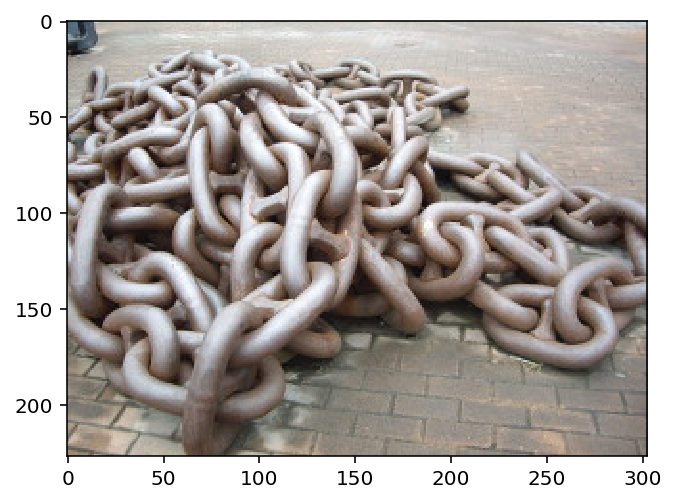

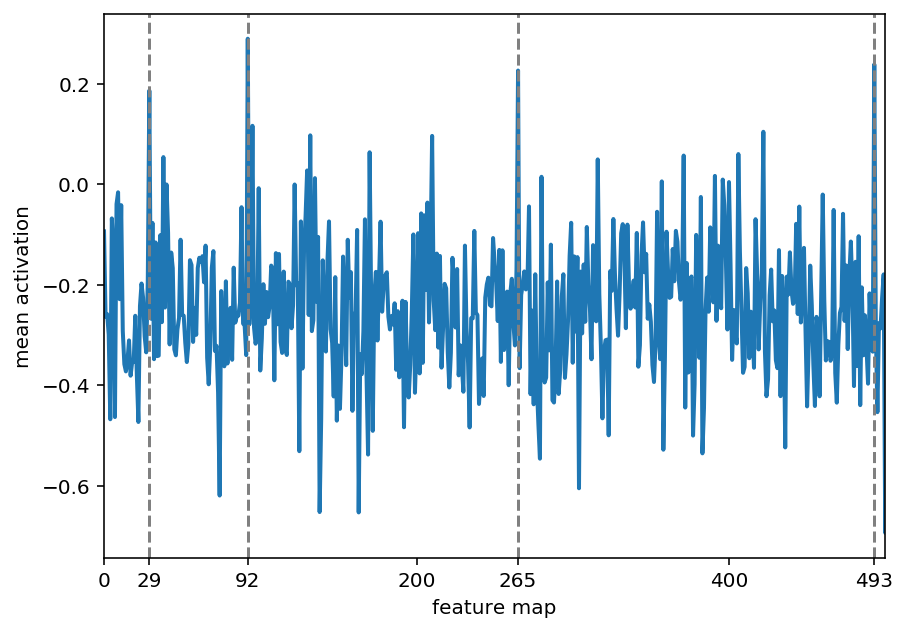

In [201]:
plot_activations_from_url("http://www.promarmex.com/img/productos/cadena_barco_1.jpg", 0.15)

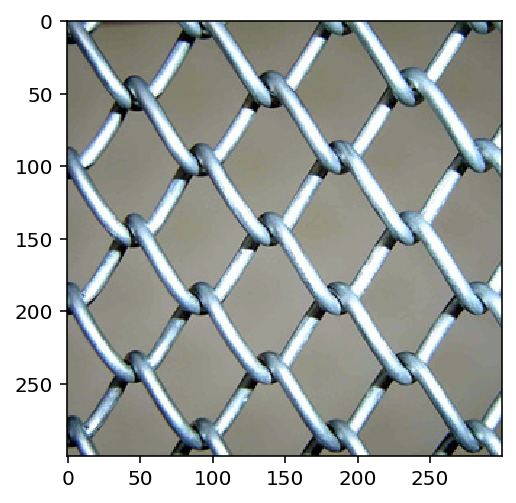

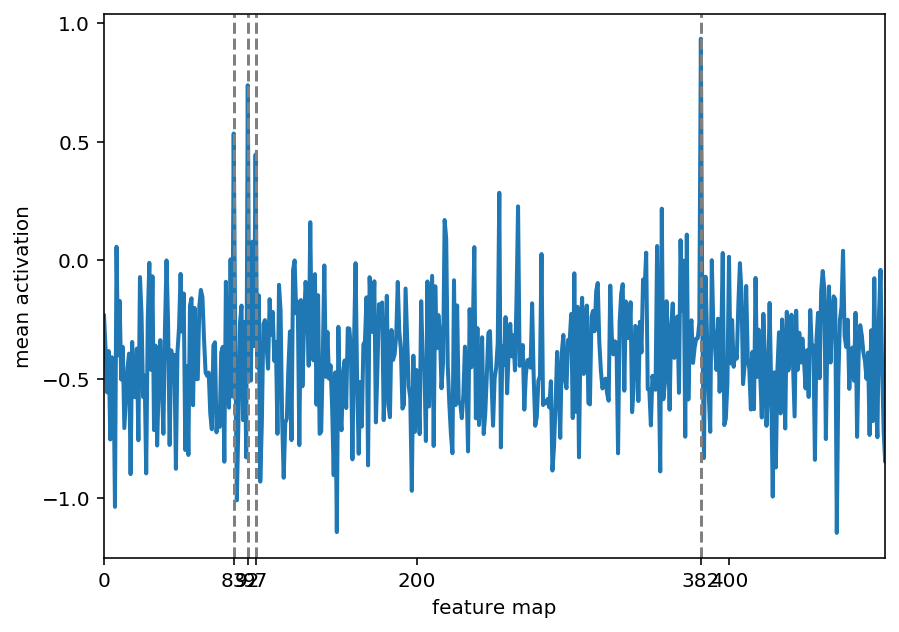

In [0]:
plot_activations_from_url("http://www.alambrados.com.ar/romboidal-grueso.jpg", 0.4)

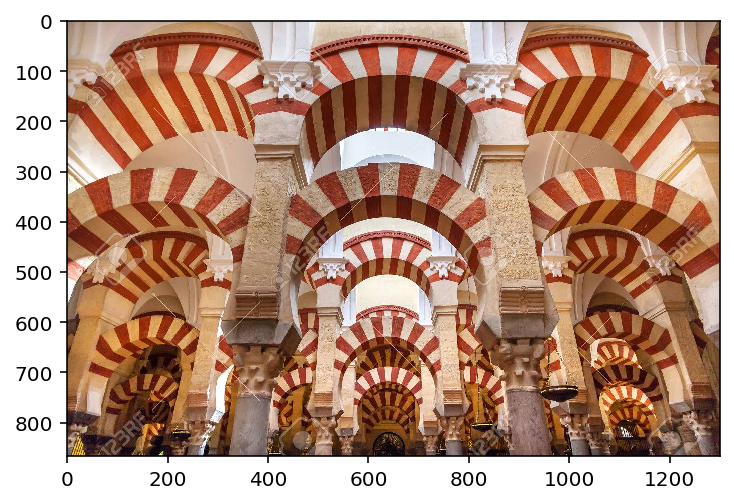

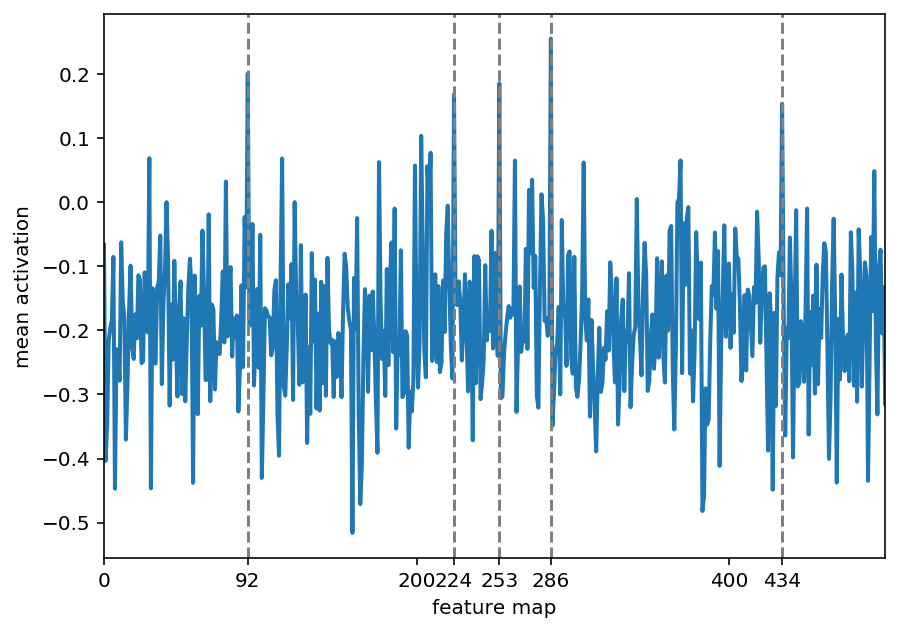

In [0]:
plot_activations_from_url("https://previews.123rf.com/images/billperry/billperry1603/billperry160300090/55406963-arcos-pilares-mezquita-c%C3%B3rdoba-espa%C3%B1a-creado-en-el-a%C3%B1o-785-como-una-mezquita-se-convirti%C3%B3-en-una-catedral-en-150.jpg", 0.15)

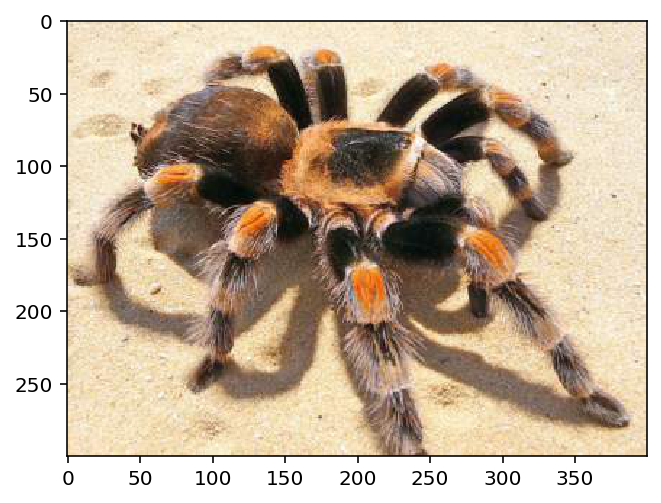

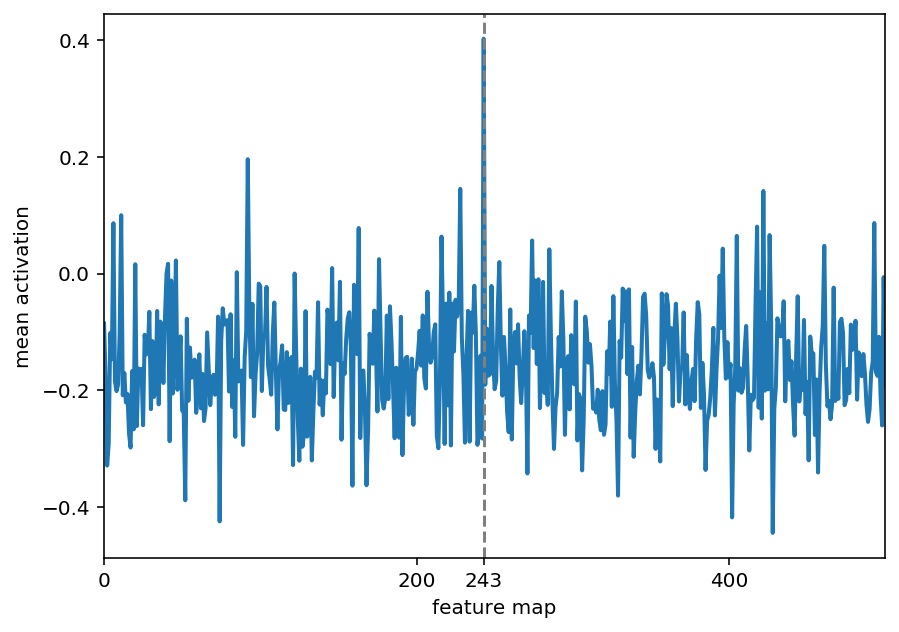

In [0]:
plot_activations_from_url("https://www.elheraldo.hn/csp/mediapool/sites/dt.common.streams.StreamServer.cls?STREAMOID=gk4U54NSB1iAjH$PwLqKAc$daE2N3K4ZzOUsqbU5sYvJeuVFq3DaXEE9dW7dI3EN6FB40xiOfUoExWL3M40tfzssyZqpeG_J0TFo7ZhRaDiHC9oxmioMlYVJD0A$3RbIiibgT65kY_CSDiCiUzvHvODrHApbd6ry6YGl5GGOZrs-&CONTENTTYPE=image/jpeg", 0.3)

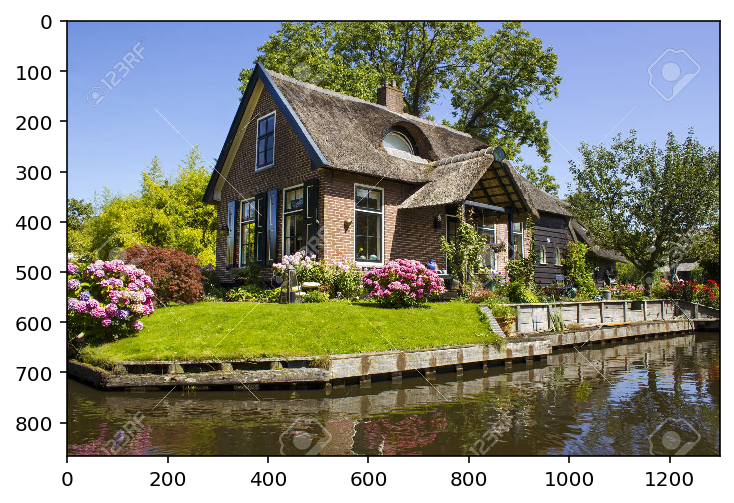

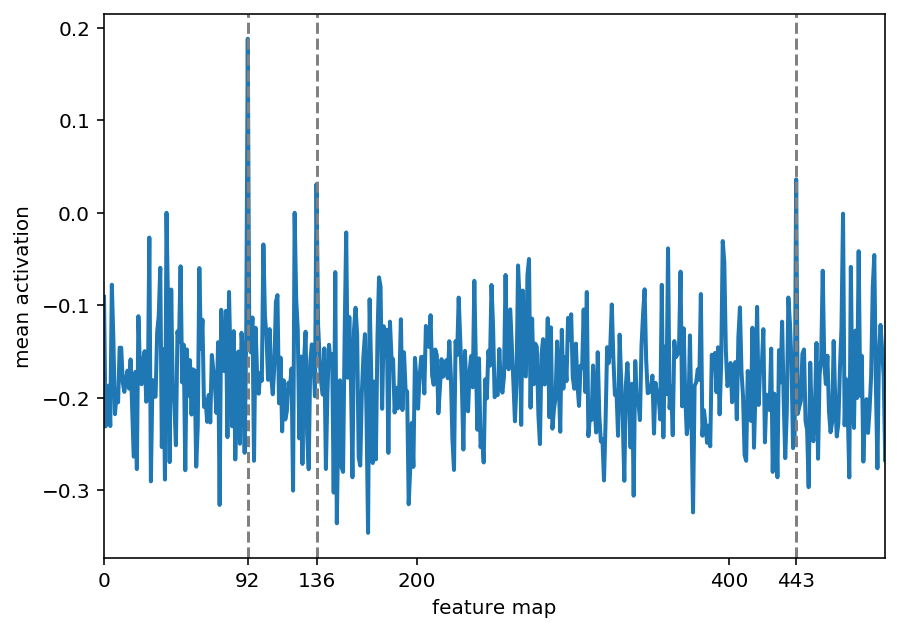

In [0]:
plot_activations_from_url("https://previews.123rf.com/images/miradrozdowski/miradrozdowski1512/miradrozdowski151200007/50390973-giethoorn-holanda-propio-lado-holand%C3%A9s-condado-de-casas-y-jardines.jpg", 0.03)

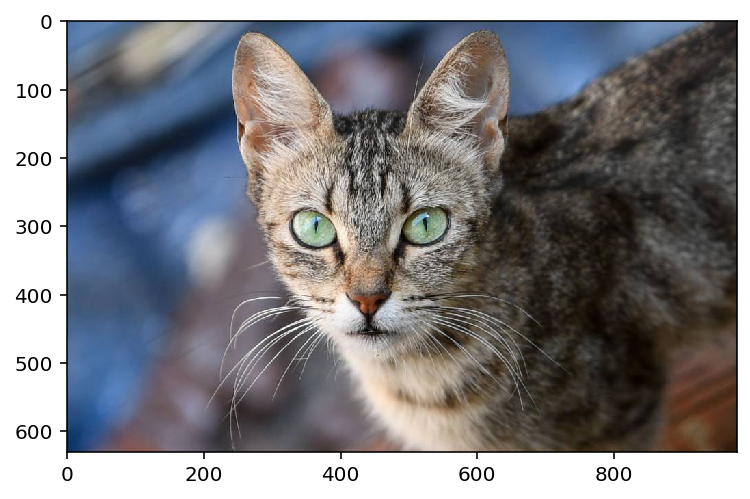

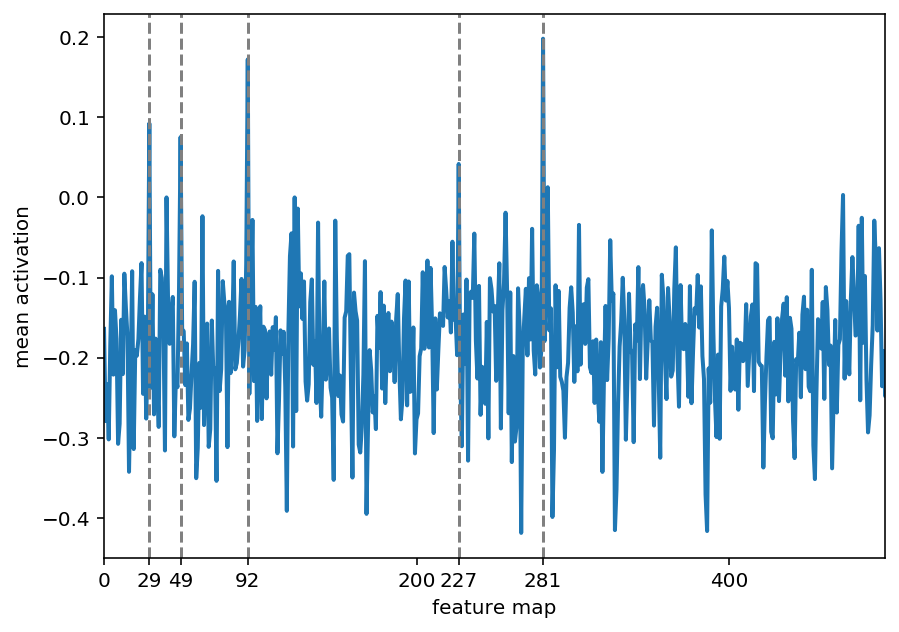

In [0]:
plot_activations_from_url("https://elpais.com/elpais/imagenes/2018/08/30/mundo_animal/1535610951_523915_1535611384_noticia_grande.jpg", 0.03)

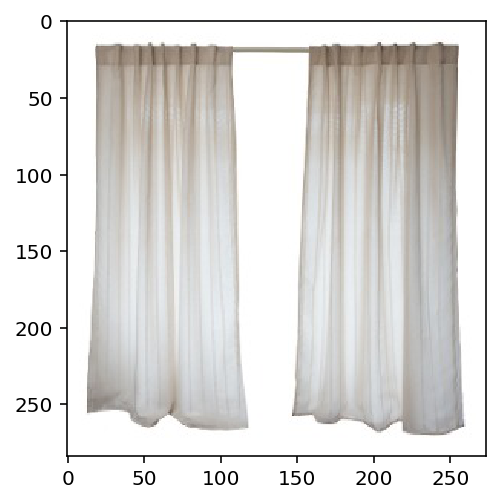

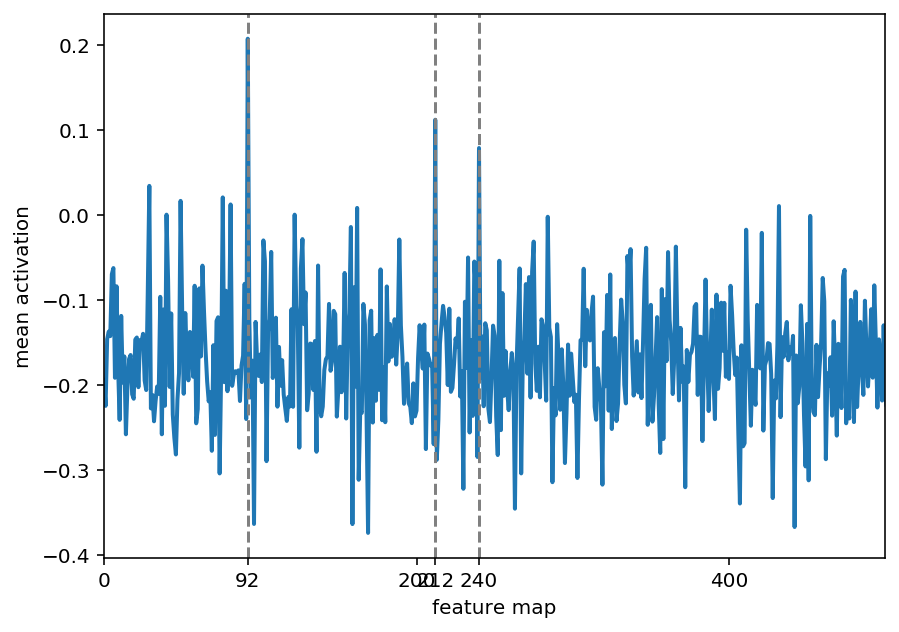

In [0]:
plot_activations_from_url("https://http2.mlstatic.com/cortinas-arco-iris-capadocia-doble-tela-140-x-210-cuotas-D_NQ_NP_698891-MLA31627793496_072019-Q.jpg", 0.05)

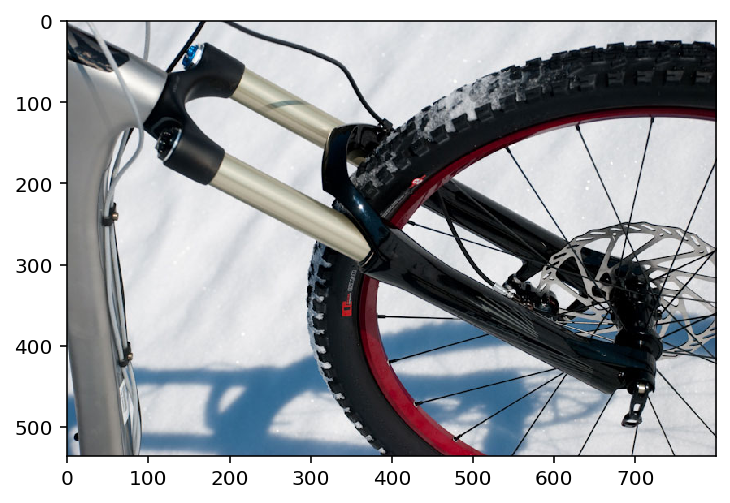

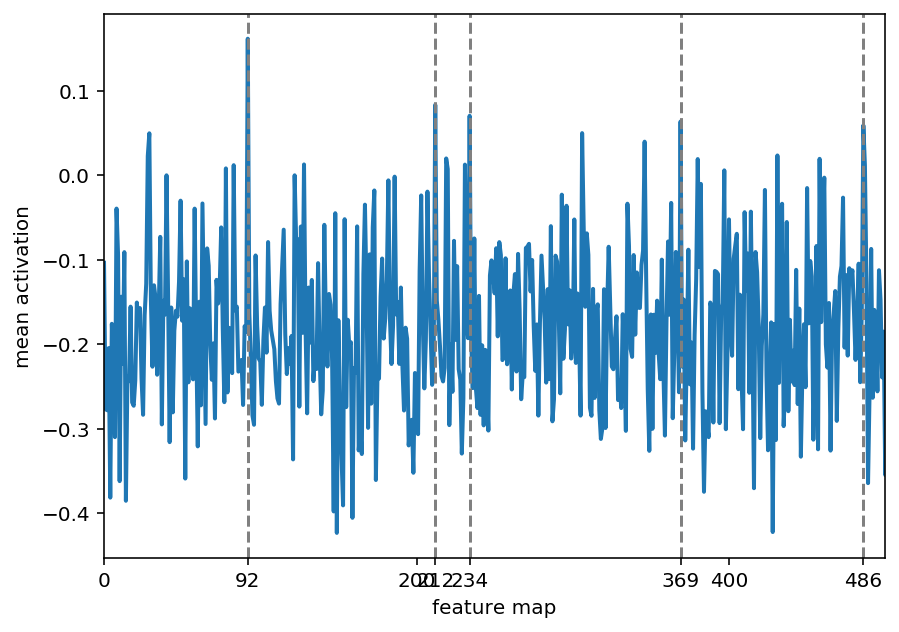

In [0]:
plot_activations_from_url("https://www.atomika.mx/media/wysiwyg/Blog/Suspension_delantera.jpg", 0.05)

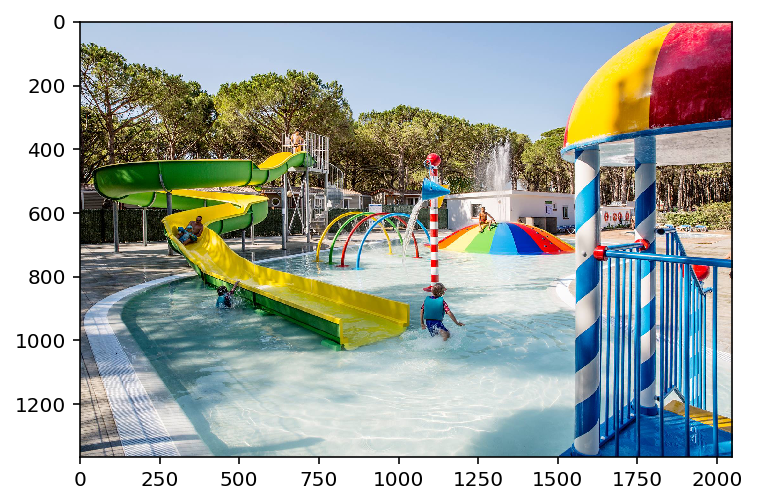

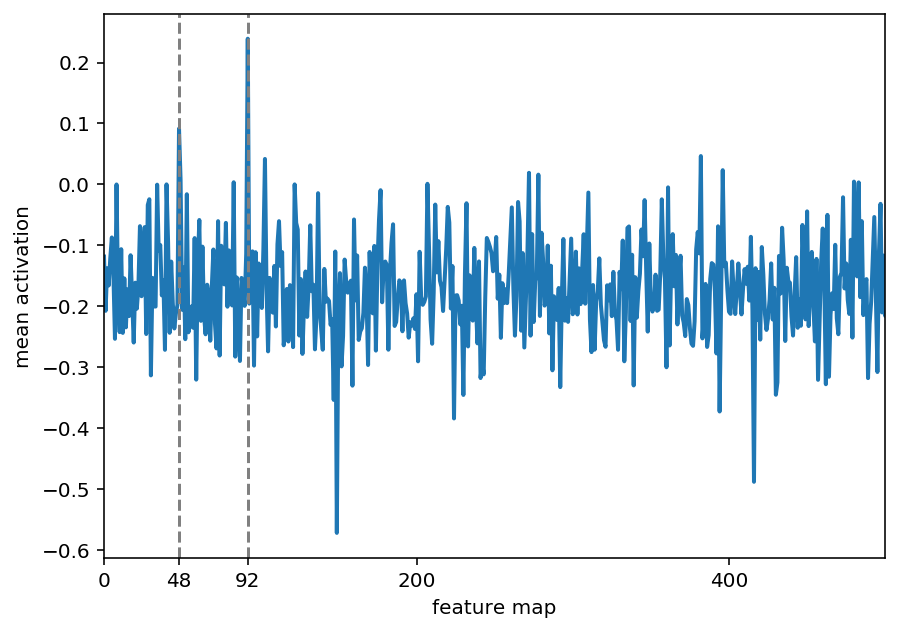

In [0]:
plot_activations_from_url("https://i0.wp.com/isaba.com/wp-content/uploads/2018/01/Foto-Burbuja-Neptuno-2.jpg",0.08)

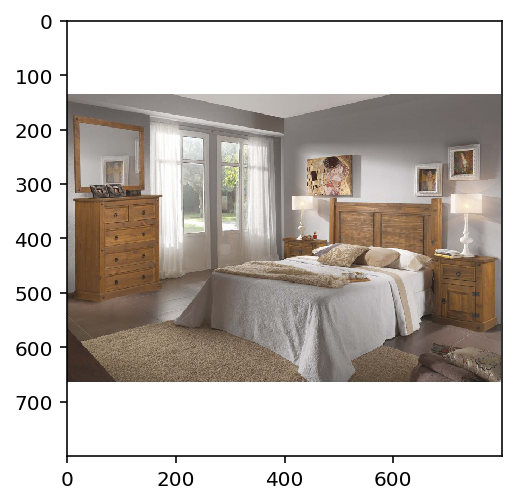

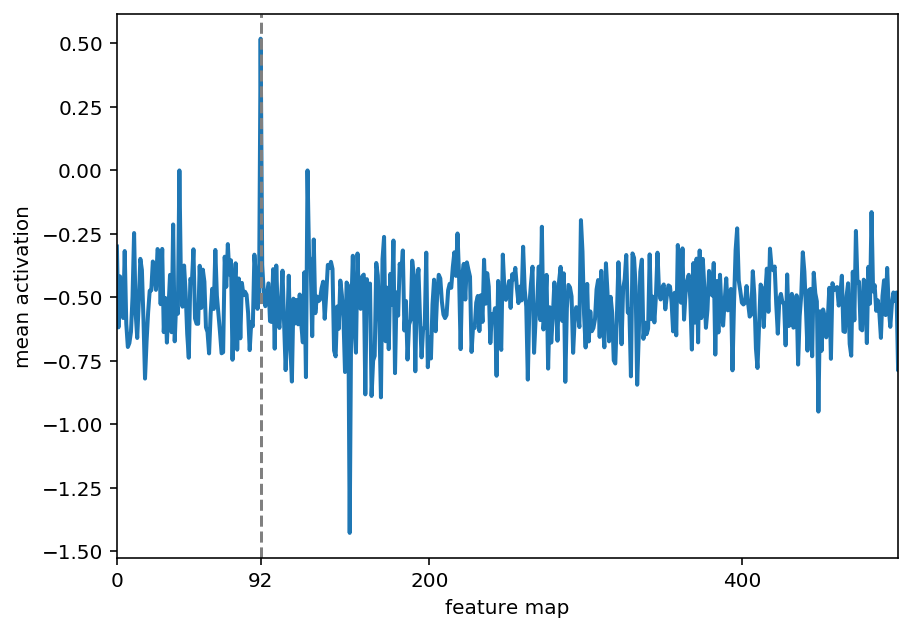

In [0]:
plot_activations_from_url("https://difactory.es/2829-thickbox_default/dormitorio-nebraska-01.jpg",0.07)

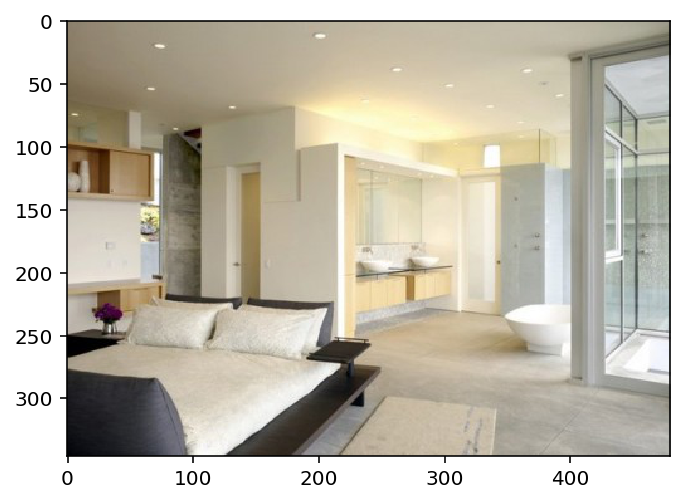

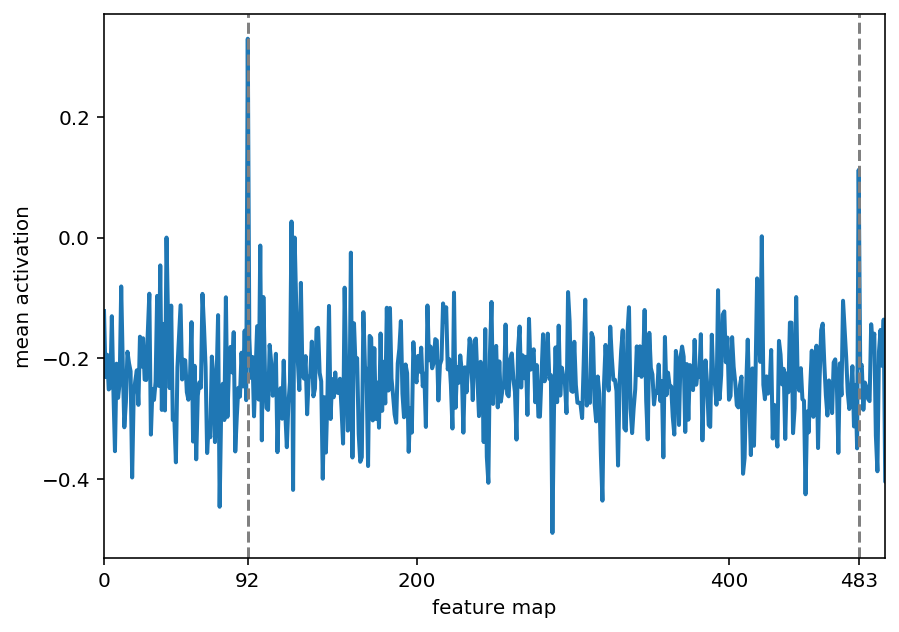

In [0]:
plot_activations_from_url("https://fotosdecasasmodernas.com/wp-content/uploads/2013/05/como-disenar-un-dormitorio-con-bano3.jpg",0.1)

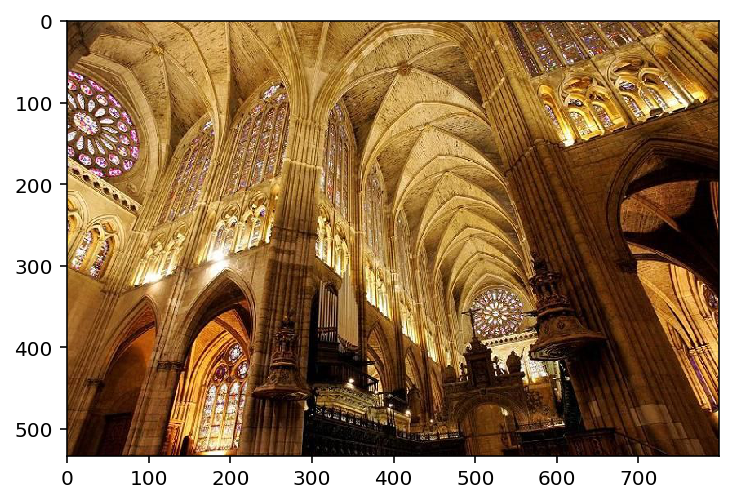

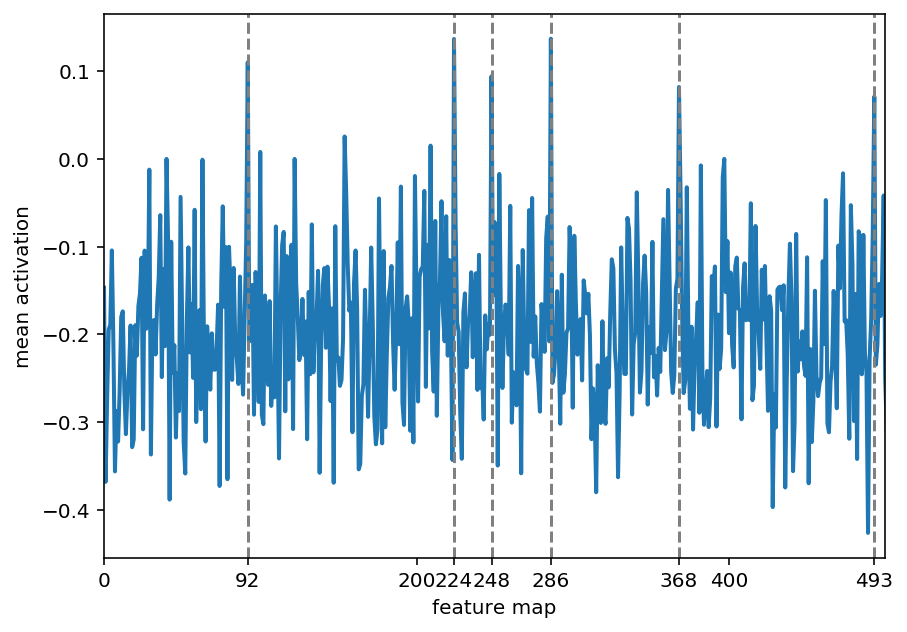

In [102]:
plot_activations_from_url("https://i.pinimg.com/originals/88/3b/64/883b64bf5dd9bb79395c2dad0ad3b6b5.jpg", 0.05)

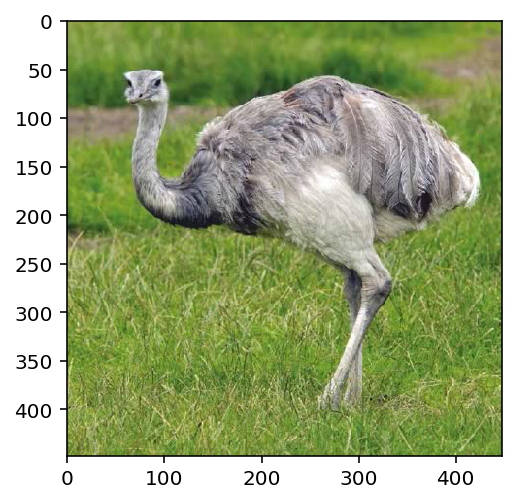

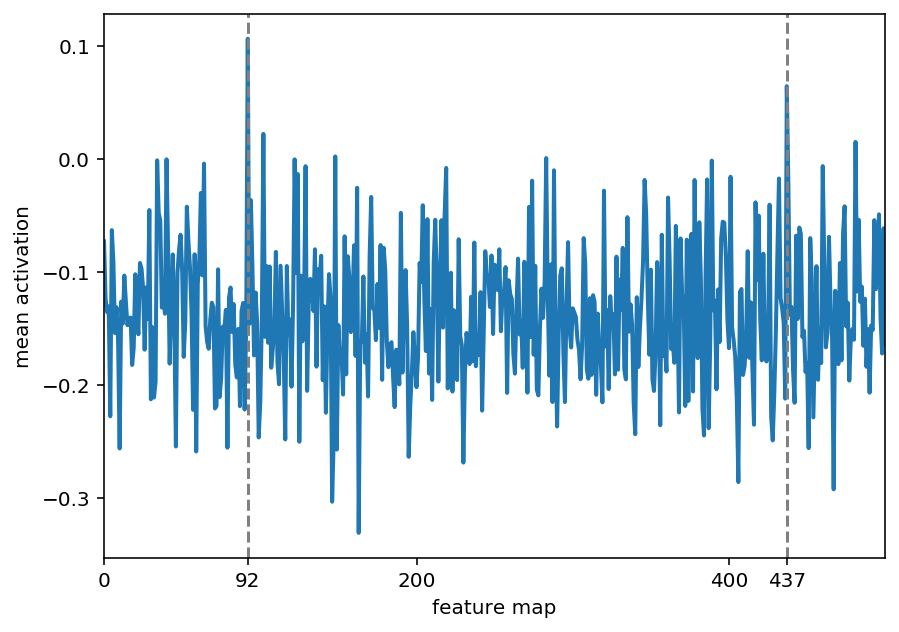

In [105]:
plot_activations_from_url("https://vignette.wikia.nocookie.net/reinoanimalia/images/5/5c/Rhea.jpg/revision/latest?cb=20181016144451&path-prefix=es", 0.05)

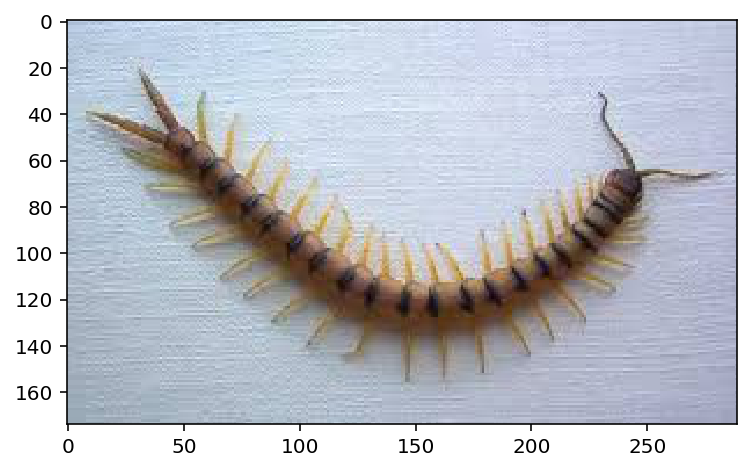

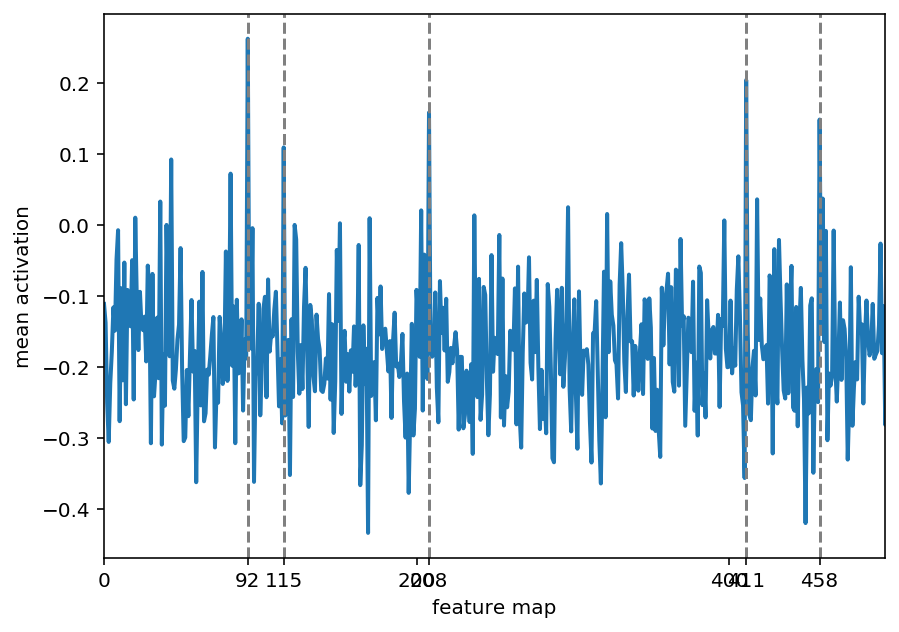

In [112]:
plot_activations_from_url("https://i.pinimg.com/originals/92/07/12/9207123ae783c4671697a6fccc5c9158.jpg", 0.1)

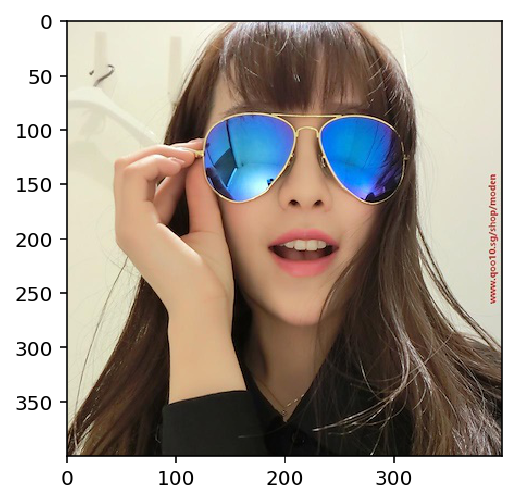

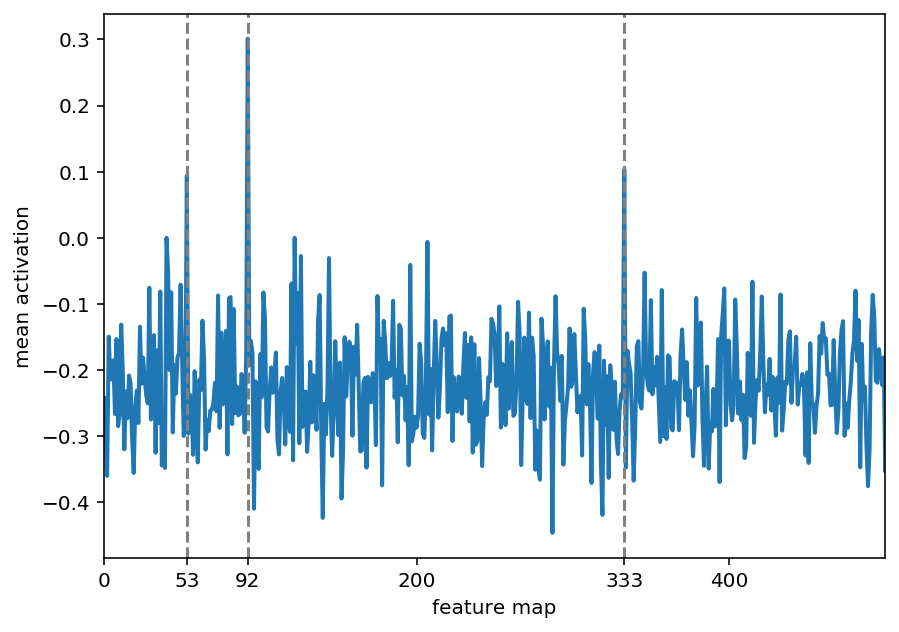

In [117]:
plot_activations_from_url("https://gd.image-gmkt.com/COLOR-FILM-SUNGLASSES-WOMAN-MAN-STAR-MODELS-SUNGLASSES-REFLECTOR/li/621/102/714102621.g_400-w_g.jpg", 0.08)

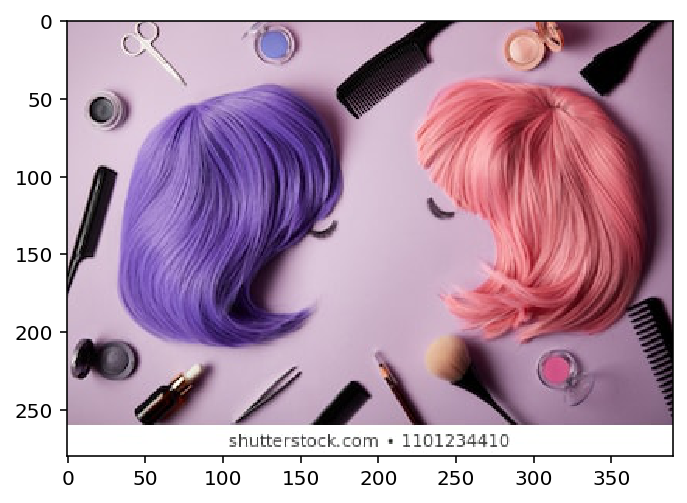

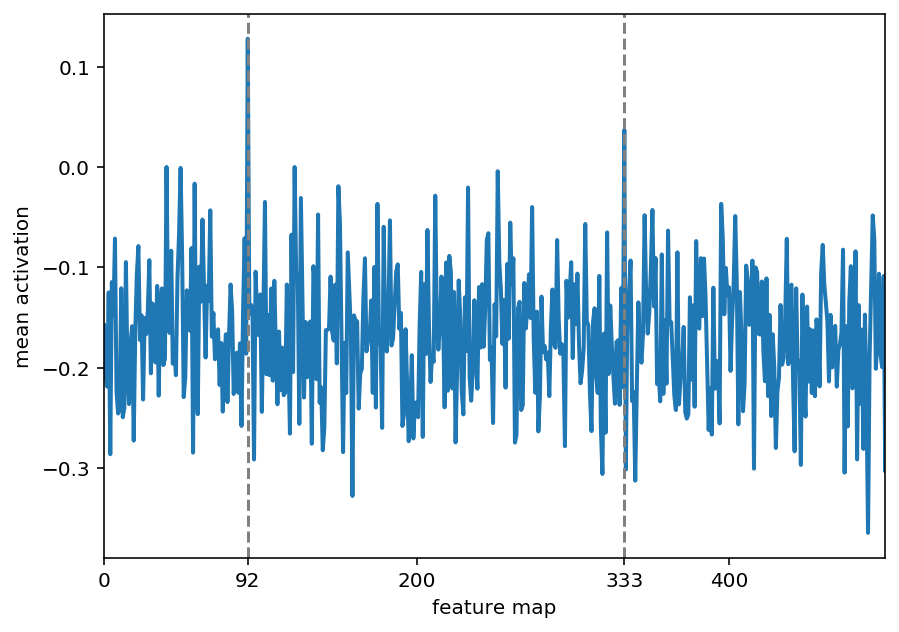

In [121]:
plot_activations_from_url("https://image.shutterstock.com/image-photo/top-view-pink-violet-wigs-260nw-1101234410.jpg", 0.02)

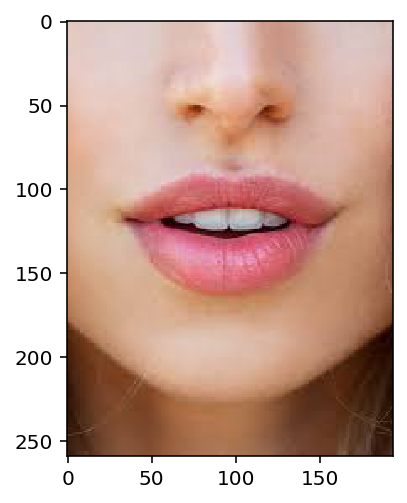

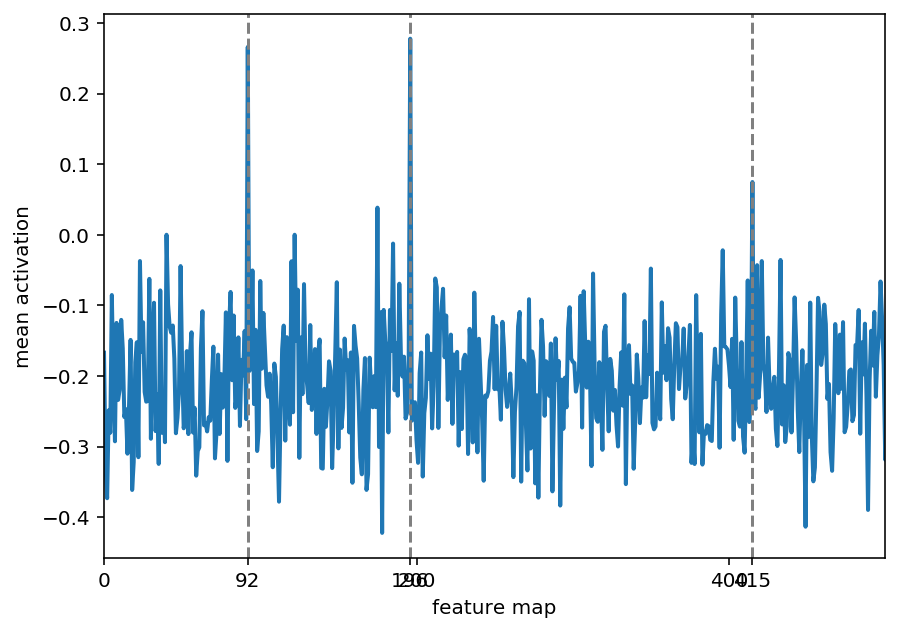

In [125]:
plot_activations_from_url("https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTE92mb-1bAjITS4Lqo9SWFmx8eeVtoqRDgW2gfV_0mcAYN9fAz&s", 0.05)

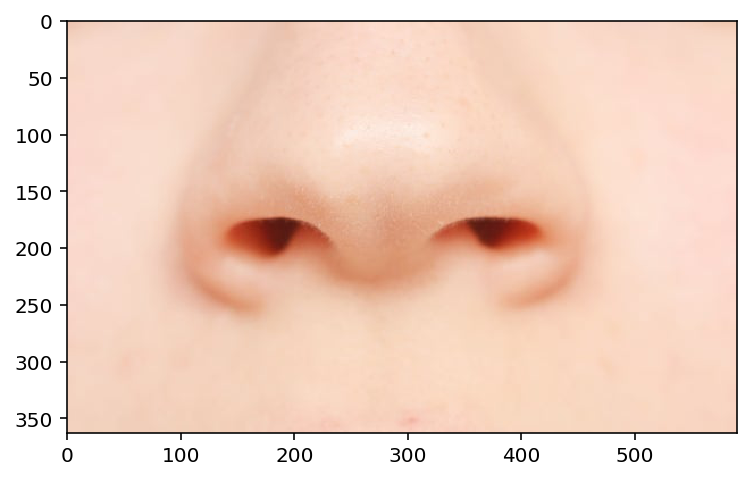

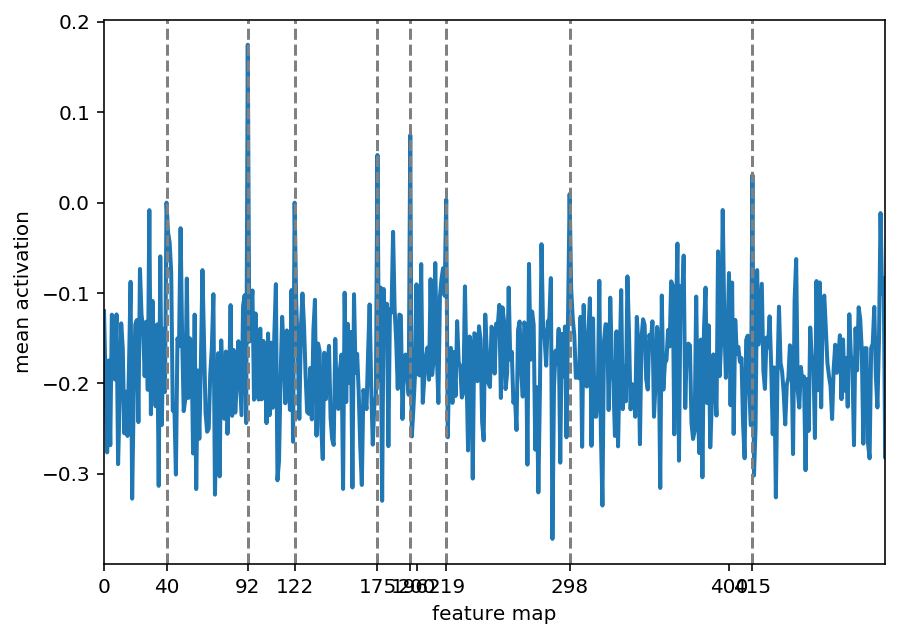

In [137]:
plot_activations_from_url("https://static.scientificamerican.com/espanol/cache/file/C96C76E3-33FF-4469-8013A0DBBF55744B_source.jpg?w=590&h=800&C74042D9-DCD1-4279-85A77FB29447D8DC", 0)

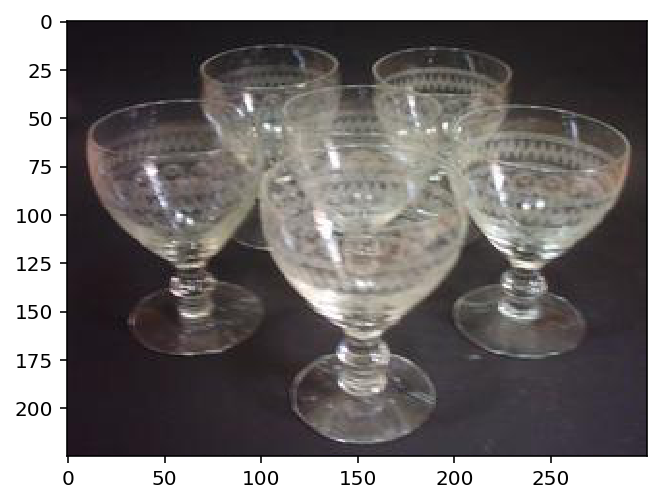

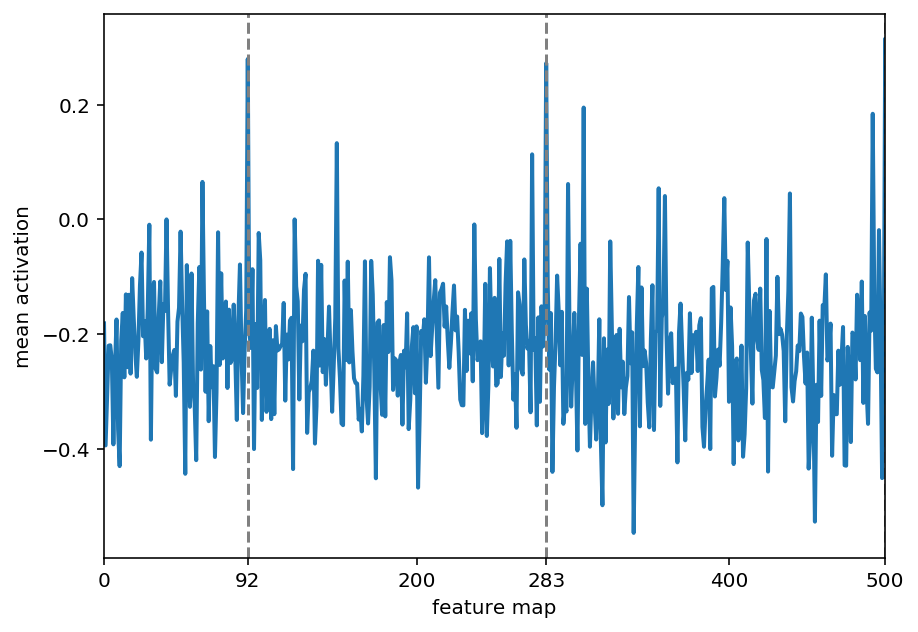

In [159]:
plot_activations_from_url("https://img.ar.class.posot.com/es_ar/2017/08/14/Seis-Copas-De-Cristal-Checoslovaco-Para-Vino-20170814031942.jpg", 0.2)

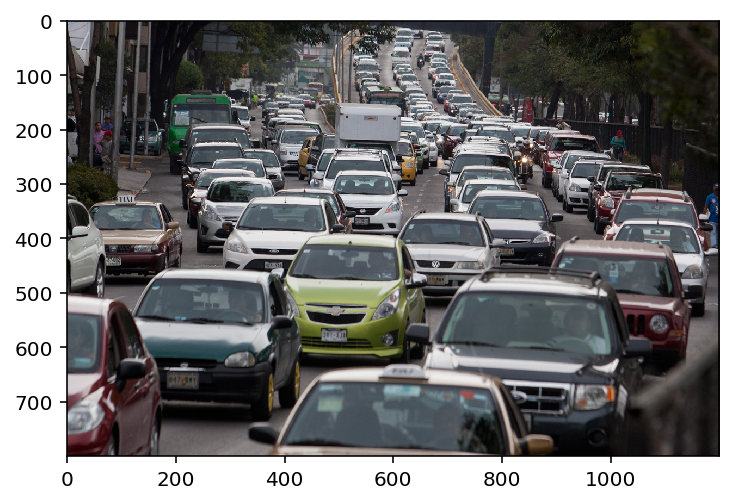

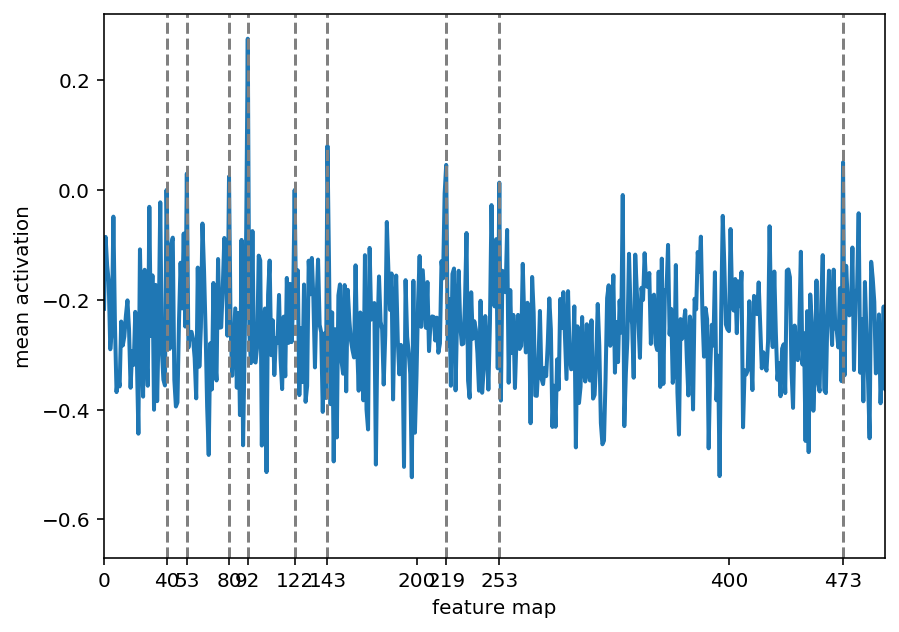

In [174]:
plot_activations_from_url("http://territorioinformativo.com/wp-content/uploads/2015/12/Tr%C3%A1nsitoPesado_inicial.jpg",0)

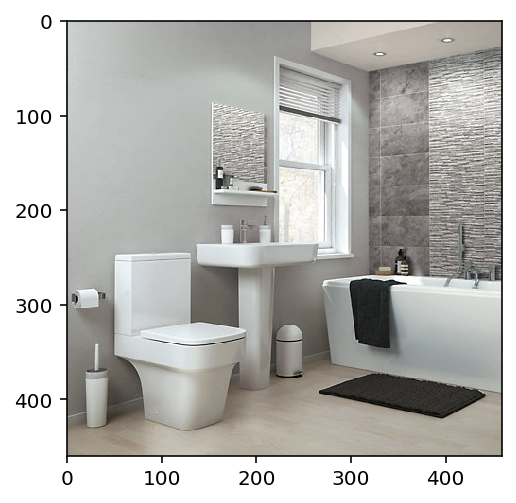

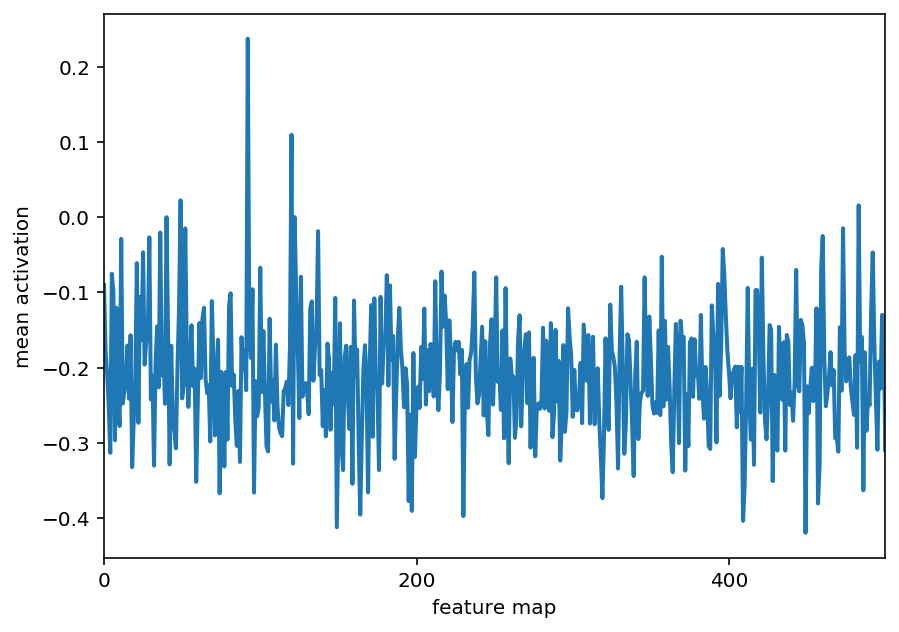

In [240]:
ac1 = plot_activations_from_url("https://kingfisher.scene7.com/is/image/Kingfisher/Category_Image_Bathroom_Suites?$PROMO_460_460$")

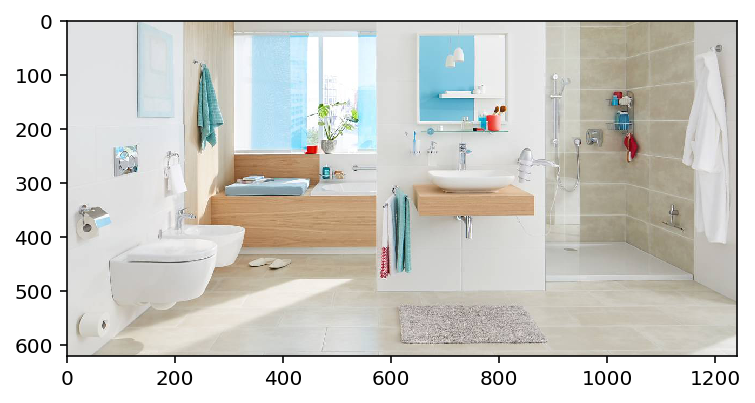

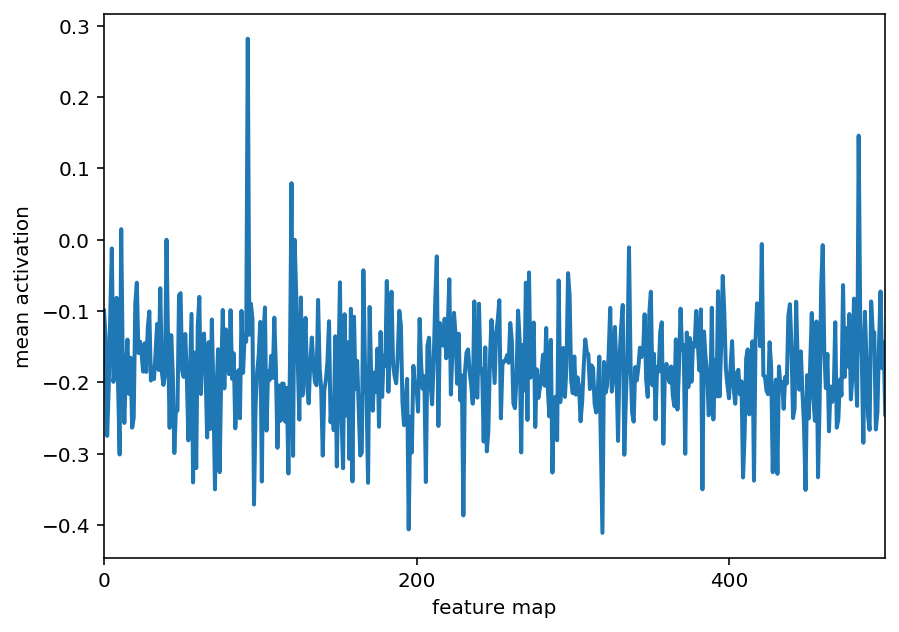

In [241]:
ac2 = plot_activations_from_url("https://www.tesa.com/en-gb/files/images/201805/1/tesa-smooz-mood-16-9,719813_crop2x1_12.jpg")

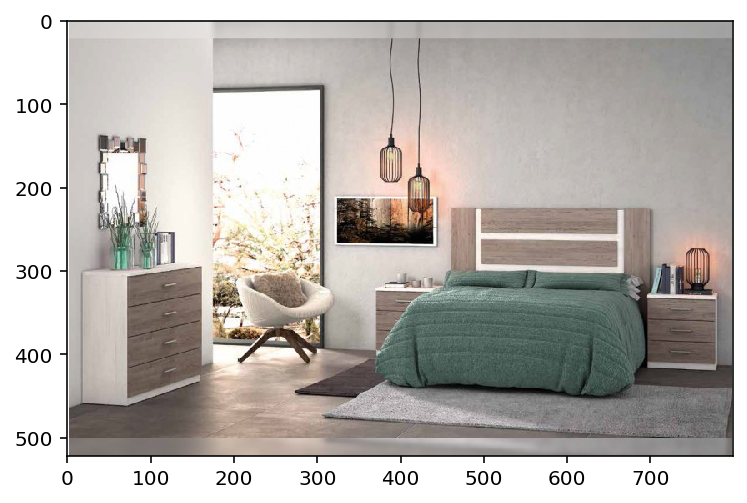

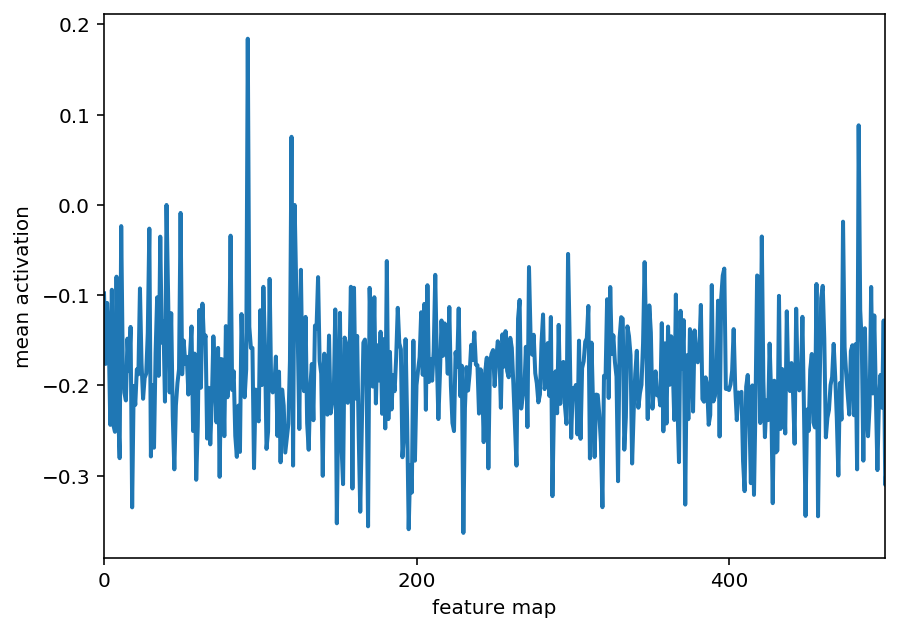

In [242]:
ac3 = plot_activations_from_url("https://tuscosasdecasa.com/8729-large_default/dormitorio-matrimonio-monika-1.jpg")

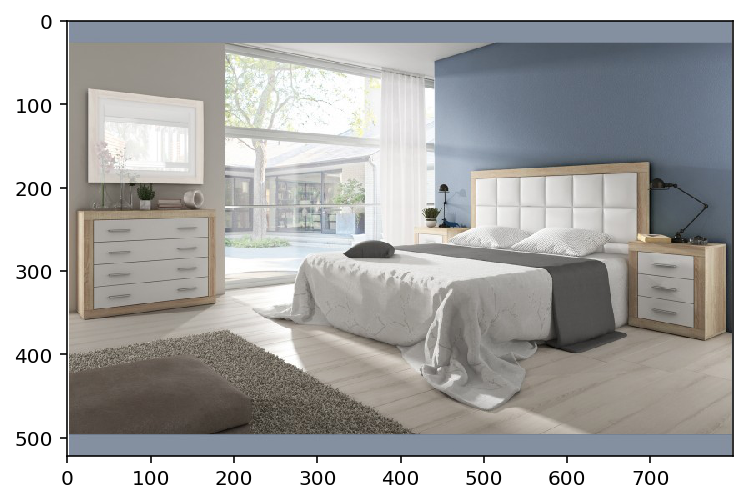

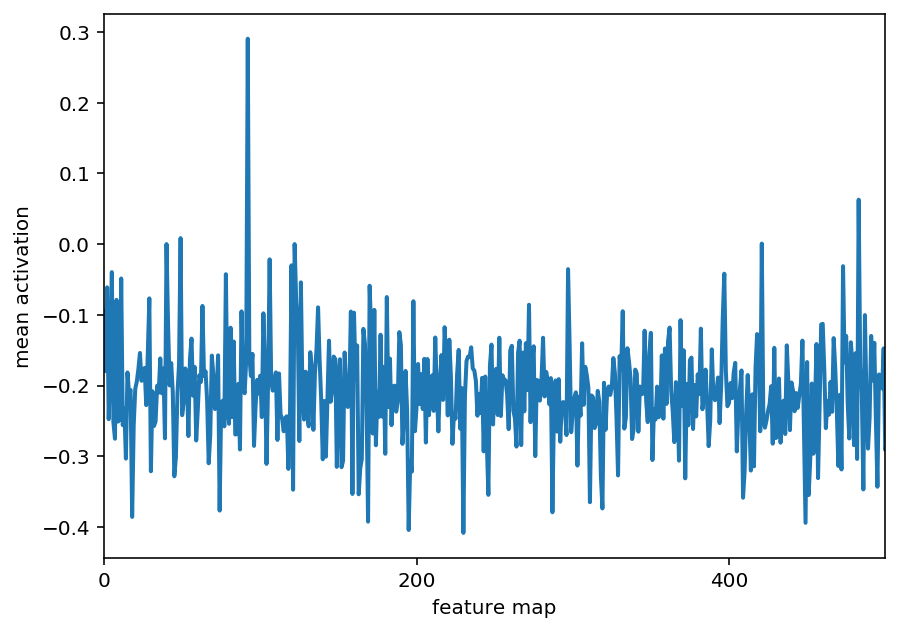

In [260]:
ac4 = plot_activations_from_url("https://tuscosasdecasa.com/5345-large_default/dormitorio-matrimonio-lara-plafon-pu-blanco.jpg")

In [0]:
def normalize(arr):
  std = np.std(arr)
  mean = np.mean(arr)
  return (arr -mean) / std

In [0]:
def outliers(arr, t = 1.5):
  s = normalize(arr)
  return set(np.argwhere(np.abs(s ) > t).flatten())

In [0]:
ac4o = outliers(ac4, 2)

In [0]:
ac3o = outliers(ac3, 2)

In [0]:
ac2o = outliers(ac2,2)

In [0]:
ac1o = outliers(ac1,2)

In [253]:
ac1o.intersection(ac3o)

{11, 29, 36, 40, 49, 92, 120, 122, 149, 164, 195, 230, 319, 449, 457, 473, 483}

In [263]:
ac2o.union(ac1o) - ac3o.union(ac4o)

{25, 52, 57, 71, 96, 101, 137, 197, 206, 213, 336, 383, 396, 416, 460, 492}

In [265]:
ac2o - ac3o

{5, 57, 71, 96, 101, 159, 206, 213, 336, 383, 409, 416, 460}

In [0]:
def get_filter_image(layer, filter):
  layer = 40
  FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
  return FV.visualize(layer, filter, blur=5)


In [0]:
def plot_filter_images(filters):
  l = 30
  f, axarr = plt.subplots(1,len(filters), figsize = (l, len(filters)*l))
  print(axarr.shape)
  for i in range(len(filters)):
    axarr[i].set_axis_off()
    axarr[i].set_title(str(filters[i]), fontsize=15)
    axarr[i].imshow(get_filter_image(40, filters[i]))

In [0]:
plot_filter_images(interesting_filters[:6])

Output hidden; open in https://colab.research.google.com to view.

In [0]:
plot_filter_images(interesting_filters[6:12])

Output hidden; open in https://colab.research.google.com to view.

In [0]:
plot_filter_images(interesting_filters[12:18])

Output hidden; open in https://colab.research.google.com to view.

In [0]:
plot_filter_images(interesting_filters[18:24])

Output hidden; open in https://colab.research.google.com to view.

In [0]:
plot_filter_images(interesting_filters[24:30])

Output hidden; open in https://colab.research.google.com to view.